# Housing Prices Prediction
## Problem Statement
> **Can we use machine learning to help prospective home buyers and sellers in King County evaluate the market value of a house?**

### Problem Understanding
Typically in the process of buying or selling a house, a home owner would hire a real estate agent to make an appraisal of the market value of a house. This appraisal then helps them decide on the best listing price of a property. Such valuations would typically be based on certain factors like the size of the house, and other indicators of value like pools, and garages.

#### King County 
![](https://www.mapsofworld.com/usa/states/washington/maps/king-wa-county-map.jpg)
King County is located in the US State of Washington. It is on the west coast of the US. 

Key Geographical Parts of King County Include:
- City of Seattle (largest city in Washington)
- Lake Washington (largest lake in KC)
- Lake Sammamish
- Lake Union 
- Airports (located in the middle and south part of KC)
- Cascade Range (a series of mountains on the east side of King County)
- Vashon Island (connected to West Seattle)
- Mercer Island

Hence our objectives would be to:
- create a model that can supplement a real estate appraisal to help home buyers/sellers in King County make better decisions
- extract insights as to how important different factors affect housing prices in King County.
## Evaluation Metrics
### Benchmark
While the US does not appear to set any margin of error for a real estate appraisal, UK case law says that the margin of error of the appraised value from the actual value should not generally exceed 15%. The typical margin of error is 5% for simple residential property valuations.

Hence, for our model to be reliable, we would expect a margin of error of less than 15% from the actual value. One way to interpret this would be a Mean Absolute Percentage Error of less than 15%. 

## Importing Libraries

In [104]:
import numpy as np
import scipy as sp
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
from tqdm import tqdm
sns.set()

# Util
from custom_util import outlierDetection, removeOutliers


# Experimental
from sklearn.experimental import enable_halving_search_cv, enable_hist_gradient_boosting

# Base Classes
from sklearn.base import BaseEstimator, TransformerMixin

# Model Evaluation
from sklearn.model_selection import train_test_split, cross_validate, KFold
from yellowbrick.model_selection import learning_curve, feature_importances
from yellowbrick.regressor import residuals_plot
from sklearn.inspection import permutation_importance

# Data Preprocessing
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer, TransformedTargetRegressor
from sklearn.preprocessing import StandardScaler, RobustScaler, MinMaxScaler, QuantileTransformer, PolynomialFeatures, OneHotEncoder
from sklearn.impute import MissingIndicator


# Models
from sklearn.dummy import DummyRegressor
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor, ExtraTreesRegressor, GradientBoostingRegressor, HistGradientBoostingRegressor
from sklearn.svm import LinearSVR

# Hyperparameter Tuning
from sklearn.model_selection import HalvingRandomSearchCV, HalvingGridSearchCV
from yellowbrick.model_selection import validation_curve

# Feature Selection
from sklearn.feature_selection import SelectFromModel, RFECV, SelectKBest, SequentialFeatureSelector, VarianceThreshold, mutual_info_regression, RFE
from statsmodels.stats.outliers_influence import variance_inflation_factor

# Random State Instance. Using a RandomState instance sets the seed for the RNG generator. This allows for reproducible results, while still ensuring robust results (e.g. not overfitting to the random state)
random_state = np.random.RandomState(42) # also note that for cross validation, the splitter will be passed an integer while the actual estimator will be passed the random state instance, as recommended by scikit-learn documentation.

## Data Ingestion

In [5]:
house_df = pd.read_csv("kc_house_data.csv")
house_df.head()

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,7129300520,20141013T000000,221900.0,3,1.00,1180,5650,1.0,0,0,...,7,1180,0,1955,0,98178,47.5112,-122.257,1340,5650
1,6414100192,20141209T000000,538000.0,3,2.25,2570,7242,2.0,0,0,...,7,2170,400,1951,1991,98125,47.7210,-122.319,1690,7639
2,5631500400,20150225T000000,180000.0,2,1.00,770,10000,1.0,0,0,...,6,770,0,1933,0,98028,47.7379,-122.233,2720,8062
3,2487200875,20141209T000000,604000.0,4,3.00,1960,5000,1.0,0,0,...,7,1050,910,1965,0,98136,47.5208,-122.393,1360,5000
4,1954400510,20150218T000000,510000.0,3,2.00,1680,8080,1.0,0,0,...,8,1680,0,1987,0,98074,47.6168,-122.045,1800,7503


## Data Exploration

### Dataset Description
This dataset contains house sale prices for King County, which includes Seattle. It includes homes sold between May 2014 and May 2015.

### Dataset Dictionary
| Column | Data Type | Remarks |
|---|---|---|
| id | Integer (Nominal) | Unique ID for each house |
| date | Date | Need to convert to dt format from string |
| price | Float (Continuous) | Target Variable. Price of House in USD |
| bedrooms | Integer (Discrete) | No. of Bedrooms in the House |
| bathrooms | Float (Discrete) | Quarter of a bathroom is a bathroom with a toilet only, no shower |
| sqft_living | Float (Continuous) | Square footage of the inside of the house |
| sqft_lot | Float (Continuous) | Square footage of the entire home, including the exterior |
| floors | Float (Discrete) | Includes split level home|
| waterfront | Integer (Boolean) | Is the property a waterfront property? |
| view | Integer (Ordinal) | On a scale of 0 to 4, how good is the view of the property |
| condition | Integer (Ordinal) | On a scale of 1 to 5, how good is the condition of the house |
| grade | Integer (Ordinal) | On a scale of 1 to 13, how good is the quality of the house |
| sqft_above | Float (Continuous) | Square footage of the parts of the house above the first floor |
| sqft_basement | Float (Continuous) | Square footage of the basement of the house |
| yr_built | Integer (Discrete) | Year of Construction |
| yr_renovated | Integer (Discrete) | Year of latest renovation |
| zipcode | Integer (Nominal) | zipcode of house |
| lat | Float (Continuous) | Latitude (North-South)|
| long | Float (Continuous) | Longitude (East-West)|
| sqft_living15 | Float (Continuous)|Average Sqft_Living for nearest 15 houses |
| sqft_lot15 | Float (Continuous) | Average Sqft_lot for nearest 15 houses |

### Objectives
- How many rows and how many columns are there?
- What does the target variable look like?
- What is the distribution of the numerical columns?
- What is the distribution of the categorical columns?
- Are there any missing values and how many of them are there?
- Are there any outliers in the data?
- How are the various columns correlated to the target variable?


In [6]:
house_eda = house_df.copy() # Make a copy the dataframe to do eda on

### Univariate Analysis

#### Descriptive Analysis

In [7]:
house_eda.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21613 entries, 0 to 21612
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   id             21613 non-null  int64  
 1   date           21613 non-null  object 
 2   price          21613 non-null  float64
 3   bedrooms       21613 non-null  int64  
 4   bathrooms      21613 non-null  float64
 5   sqft_living    21613 non-null  int64  
 6   sqft_lot       21613 non-null  int64  
 7   floors         21613 non-null  float64
 8   waterfront     21613 non-null  int64  
 9   view           21613 non-null  int64  
 10  condition      21613 non-null  int64  
 11  grade          21613 non-null  int64  
 12  sqft_above     21613 non-null  int64  
 13  sqft_basement  21613 non-null  int64  
 14  yr_built       21613 non-null  int64  
 15  yr_renovated   21613 non-null  int64  
 16  zipcode        21613 non-null  int64  
 17  lat            21613 non-null  float64
 18  long  

- There are 21613 rows and 21 columns.
- There appear to be no missing values in the data.
- `date` has an incorrect data type. It should be represented as a date instead of a string.

In [17]:
house_eda["date"] = pd.to_datetime(house_eda["date"])

In [18]:
house_eda.describe()

,id,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
count,2.161300e+04,2.161300e+04,21613.000000,21613.000000,21613.000000,2.161300e+04,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000
mean,4.580302e+09,5.400881e+05,3.370842,2.114757,2079.899736,1.510697e+04,1.494309,0.007542,0.234303,3.409430,7.656873,1788.390691,291.509045,1971.005136,84.402258,98077.939805,47.560053,-122.213896,1986.552492,12768.455652
std,2.876566e+09,3.671272e+05,0.930062,0.770163,918.440897,4.142051e+04,0.539989,0.086517,0.766318,0.650743,1.175459,828.090978,442.575043,29.373411,401.679240,53.505026,0.138564,0.140828,685.391304,27304.179631
min,1.000102e+06,7.500000e+04,0.000000,0.000000,290.000000,5.200000e+02,1.000000,0.000000,0.000000,1.000000,1.000000,290.000000,0.000000,1900.000000,0.000000,98001.000000,47.155900,-122.519000,399.000000,651.000000
25%,2.123049e+09,3.219500e+05,3.000000,1.750000,1427.000000,5.040000e+03,1.000000,0.000000,0.000000,3.000000,7.000000,1190.000000,0.000000,1951.000000,0.000000,98033.000000,47.471000,-122.328000,1490.000000,5100.000000
50%,3.904930e+09,4.500000e+05,3.000000,2.250000,1910.000000,7.618000e+03,1.500000,0.000000,0.000000,3.000000,7.000000,1560.000000,0.000000,1975.000000,0.000000,98065.000000,47.571800,-122.230000,1840.000000,7620.000000
75%,7.308900e+09,6.450000e+05,4.000000,2.500000,2550.000000,1.068800e+04,2.000000,0.000000,0.000000,4.000000,8.000000,2210.000000,560.000000,1997.000000,0.000000,98118.000000,47.678000,-122.125000,2360.000000,10083.000000
max,9.900000e+09,7.700000e+06,33.000000,8.000000,13540.000000,1.651359e+06,3.500000,1.000000,4.000000,5.000000,13.000000,9410.000000,4820.000000,2015.000000,2015.000000,98199.000000,47.777600,-121.315000,6210.000000,871200.000000


- Housing Prices are likely to be positively skewed with many outliers, as the max price of the houses is much larger than the upper quartile.
- Similarly, living space and lot space also has a positively skewed distribution.
- Most houses are not waterfront properties (at least 75%)
- Most houses have 0 basement space. 
- At least 75% of houses have never been renovated.

#### Target Variable
The target variable we are trying to predict is the price in USD of the house.

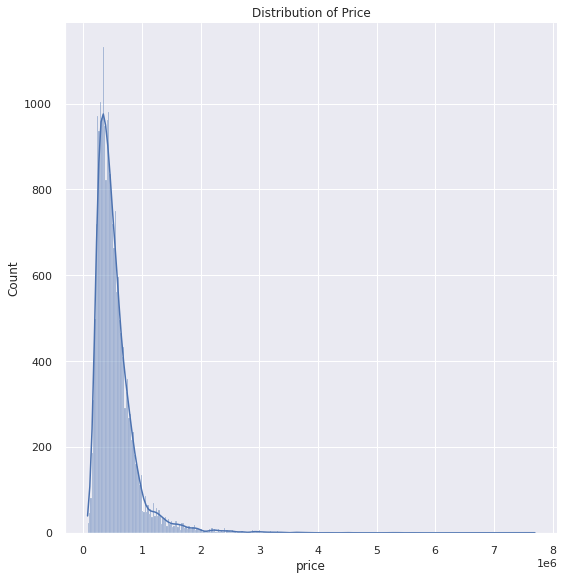

In [19]:
sns.displot(data=house_eda, x="price", kde=True, height = 8)
plt.title("Distribution of Price")
plt.show()

We note that the distribution of the price is heavily positively skewed. Most houses are less than $100K USD, but some houses cost more than a million. This suggests that the mean and standard deviation of the price might not be the best descriptor of it's distribution.

In [20]:
price_median = house_eda["price"].median() 
price_iqr = house_eda["price"].quantile(.75) - house_eda["price"].quantile(.25) 
print(f"Median Price: ${price_median}, Price IQR: ${price_iqr}")

Median Price: $450000.0, Price IQR: $323050.0


When looking at the median price, we note that while it is still quite high, the prices are more reasonable.

Shape Before Removing Outliers: (21613, 1)
Shape After Removing Outliers: (20467, 1)


<AxesSubplot:xlabel='price'>

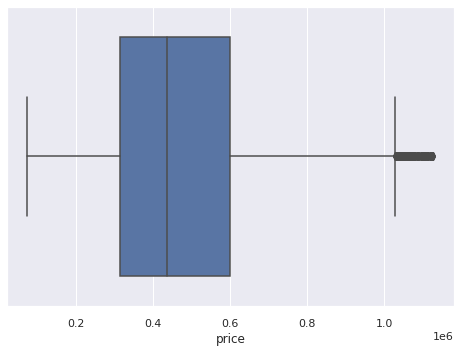

In [21]:
sns.boxplot(x="price", data = removeOutliers(house_eda[["price"]]))

When the extreme values are removed, we can see the typical distribution more clearly.

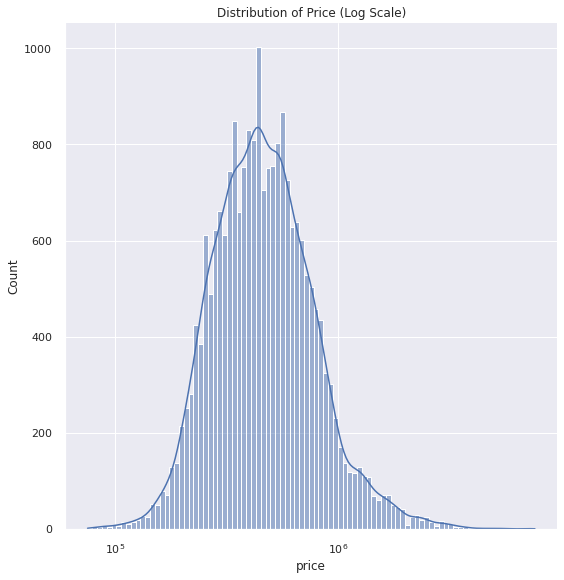

In [22]:
sns.displot(data=house_eda, x="price", kde=True, log_scale=True,height = 8)
plt.title("Distribution of Price (Log Scale)")
plt.show()

When plotted on a log scale, the prices appear to follow a normal distribution. This suggests that prices in King County follow a log normal distribution, suggesting that transformation of the target variable to accurately reflect this might improve the performance of the model.

#### Numerical Features

In [13]:
numerical_features = ['bedrooms', 'bathrooms', 'sqft_living', 'sqft_lot', 'floors', 'sqft_above', 'sqft_basement', 'yr_built', 'yr_renovated', 'sqft_living15', 'sqft_lot15', 'lat', 'long']

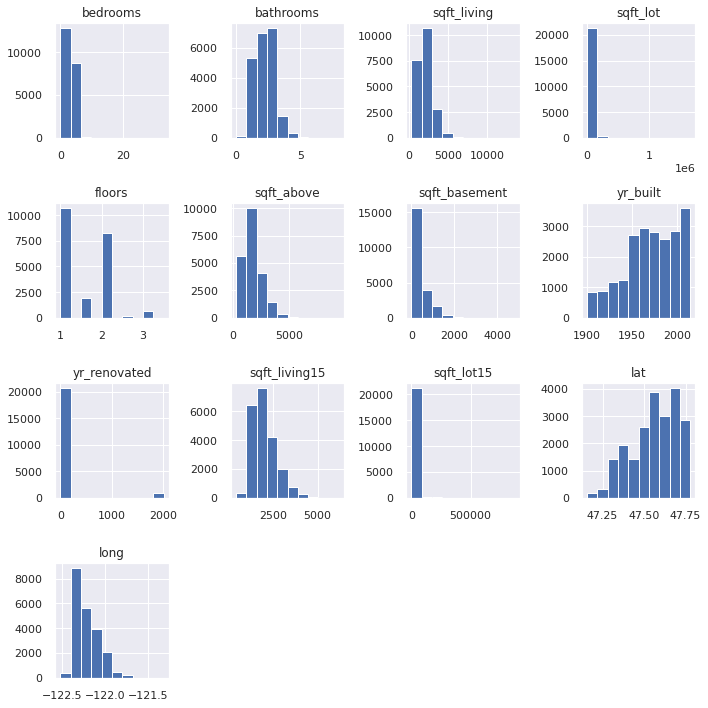

In [14]:
house_eda[numerical_features].hist(figsize=(10, 10))
plt.tight_layout()
plt.show()

Based on the histograms, we see that
- Living area appears to be positively skewed
- Most houses have never been renovated, as suggested by most having a year of 0 (a prefilled indicator value)
- Most houses were constructed after 1950
- Most houses have very similar and small lot sizes. 

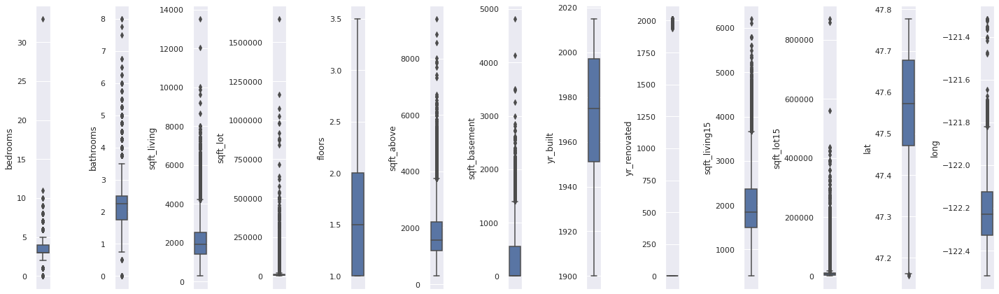

In [15]:
fig, ax = plt.subplots(1, len(numerical_features), figsize=(20, 6), tight_layout = True)

for idx, col in enumerate(numerical_features):
    ax[idx].ticklabel_format(useOffset=False, style='plain') # do not use scientific notation
    sns.boxplot(data = house_eda, y=col, ax = ax[idx])
fig.show()

From the boxplots we note that
- There is one extreme outlier house with more than 30 bedrooms. 
- While most houses have low lot sizes, a few have extremely large lot sizes, presumably located in more rural areas, but this will have to be investigated further.

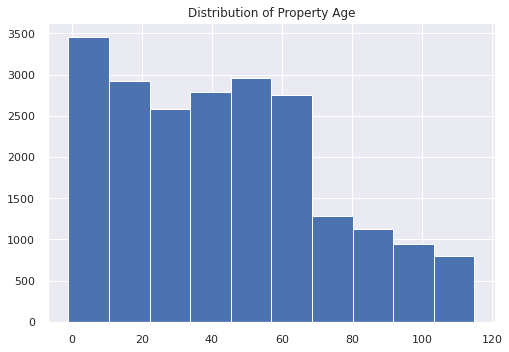

In [23]:
house_eda["age"] = house_eda["date"].dt.year - house_eda["yr_built"]
house_eda["age"].hist()
plt.title("Distribution of Property Age")
plt.show()


Most houses are between 20 and 60 years of age. The distribution of age is positively skewed, with a few houses being very old (>100 years old)

In [24]:
def cat_plot(df, features, figsize = (10, 20)):
    fig, ax = plt.subplots(len(features), 1, figsize= figsize, tight_layout = True)
    for idx, feature in enumerate(features):
        ax[idx].set_title("Counts of " + feature)
        # counts = df[feature].value_counts()
        sns.countplot(data = df, y = feature, ax = ax[idx])
    return fig

We want to investigate values of discrete data further.

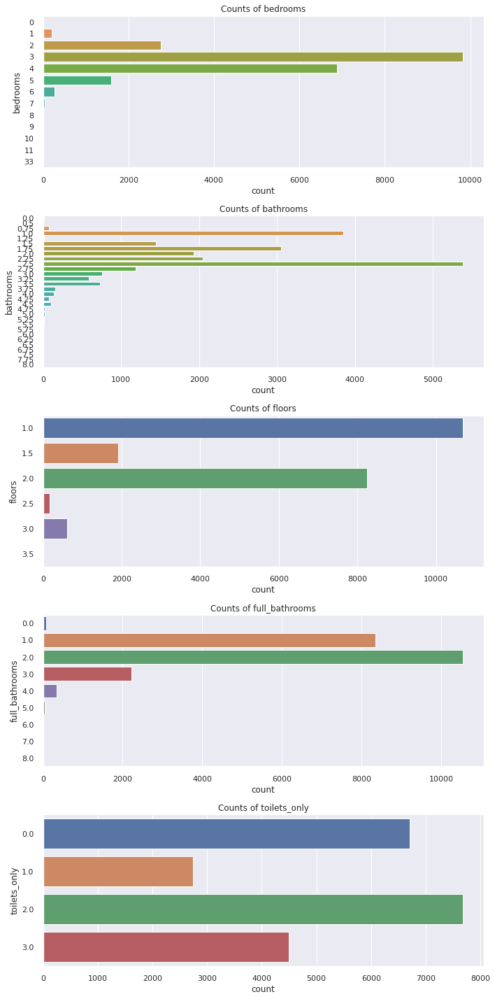

In [25]:
house_eda["full_bathrooms"] = house_eda["bathrooms"].apply(lambda x : np.floor(x))
house_eda["toilets_only"] = (house_eda["bathrooms"] - house_eda["full_bathrooms"]) / 0.25
count_data = ["bedrooms", "bathrooms", "floors", "full_bathrooms", "toilets_only"]
fig = cat_plot(house_eda, count_data)

Most houses have:
- 3 Bedrooms
- 2 Full Bathrooms (shower)
- 2 Toilets
- 1 Floor

We note that some houses are split level properties.

Strangely we also see a few houses apparently have zero bedrooms and zero bathrooms. These must be investigated later on.

#### Categorical Features

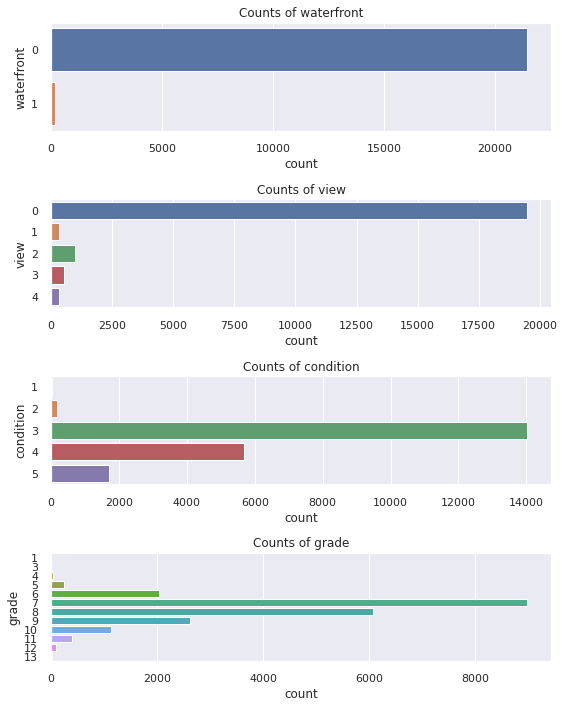

In [26]:
categorical_features = ['waterfront', 'view', 'condition', 'grade']
fig = cat_plot(house_eda, categorical_features, figsize=(8, 10))

Most houses:
- are not waterfront properties
- have a poor view 
- are of average condition
- have a grade of 7 (average quality)

#### Time Series Features

In [29]:
house_eda["month"] = house_eda["date"].dt.month

<AxesSubplot:xlabel='month', ylabel='count'>

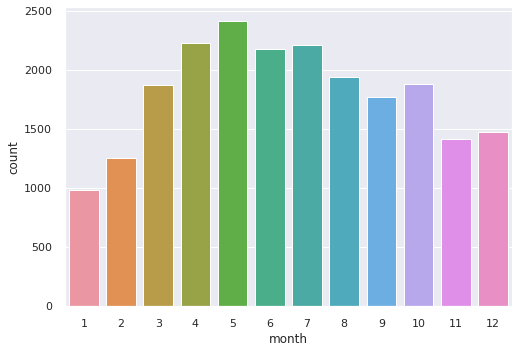

In [30]:
sns.countplot(x="month", data=house_eda)

Most houses are sold between April (4th month) and August (8th Month). The least houses are sold in January and Feburary.

#### Investigating Outliers & Anomalies

We start by investigating those properties which are an outlier in terms of their number of bedrooms.

Outliers in Series (First 5)


,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,age,full_bathrooms,toilets_only,month
154,7920100045,2014-05-16,350000.0,1,1.00,700,5100,1.0,0,0,...,0,98115,47.6790,-122.300,1010,5100,72,1.0,0.0,5
209,6300000550,2014-07-17,464000.0,6,3.00,2300,3404,2.0,0,0,...,1994,98133,47.7067,-122.343,1560,1312,94,3.0,0.0,7
232,9264902050,2014-11-21,315000.0,6,2.75,2940,7350,1.0,0,0,...,0,98023,47.3103,-122.339,2120,8236,36,2.0,3.0,11
239,5152100060,2014-05-29,472000.0,6,2.50,4410,14034,1.0,0,2,...,0,98003,47.3376,-122.324,2600,13988,49,2.0,2.0,5
264,2123039032,2014-10-27,369900.0,1,0.75,760,10079,1.0,1,4,...,0,98070,47.4683,-122.438,1230,14267,78,0.0,3.0,10


No. of Outliers: 546
/home/tiencheng/anaconda3/envs/data_sci_base_v1_2021/lib/python3.9/site-packages/seaborn/_core.py:1312: UserWarning: Horizontal orientation ignored with only `y` specified.
  warnings.warn(single_var_warning.format("Horizontal", "y"))


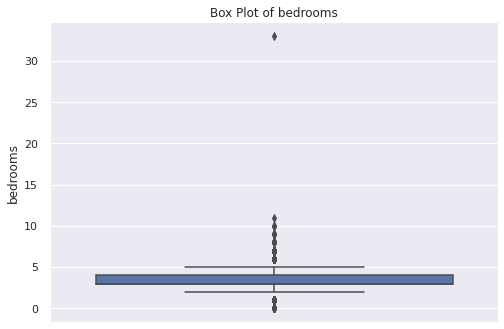

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,age,full_bathrooms,toilets_only,month
9854,7849202190,2014-12-23,235000.0,0,0.00,1470,4800,2.0,0,0,...,0,98065,47.5265,-121.828,1060,7200,18,0.0,0.0,12
14423,9543000205,2015-04-13,139950.0,0,0.00,844,4269,1.0,0,0,...,0,98001,47.2781,-122.250,1380,9600,102,0.0,0.0,4
875,6306400140,2014-06-12,1095000.0,0,0.00,3064,4764,3.5,0,2,...,0,98102,47.6362,-122.322,2360,4000,24,0.0,0.0,6
8477,2569500210,2014-11-17,339950.0,0,2.50,2290,8319,2.0,0,0,...,0,98042,47.3473,-122.151,2500,8751,29,2.0,2.0,11
3467,1453602309,2014-08-05,288000.0,0,1.50,1430,1650,3.0,0,0,...,0,98125,47.7222,-122.290,1430,1650,15,1.0,2.0,8
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13314,627300145,2014-08-14,1148000.0,10,5.25,4590,10920,1.0,0,2,...,0,98004,47.5861,-122.113,2730,10400,6,5.0,1.0,8
19254,8812401450,2014-12-29,660000.0,10,3.00,2920,3745,2.0,0,0,...,0,98105,47.6635,-122.320,1810,3745,101,3.0,0.0,12
15161,5566100170,2014-10-29,650000.0,10,2.00,3610,11914,2.0,0,0,...,0,98006,47.5705,-122.175,2040,11914,56,2.0,0.0,10
8757,1773100755,2014-08-21,520000.0,11,3.00,3000,4960,2.0,0,0,...,1999,98106,47.5560,-122.363,1420,4960,96,3.0,0.0,8


In [31]:
outlierDetection(house_eda, "bedrooms")

Earlier, we noted those houses with no bedrooms and bathrooms were suspicious. It turns out from research that these places actually correspond to empty lots which are bing sold. Hence, they are not data entry errors, but represent a specific type of property. Since they are outliers, we may want to consider removing them from training to improve any future models.

### Bivariate Analysis

In [32]:
house_corr = house_eda.drop(['id', 'zipcode', 'date'], axis=1).corr()


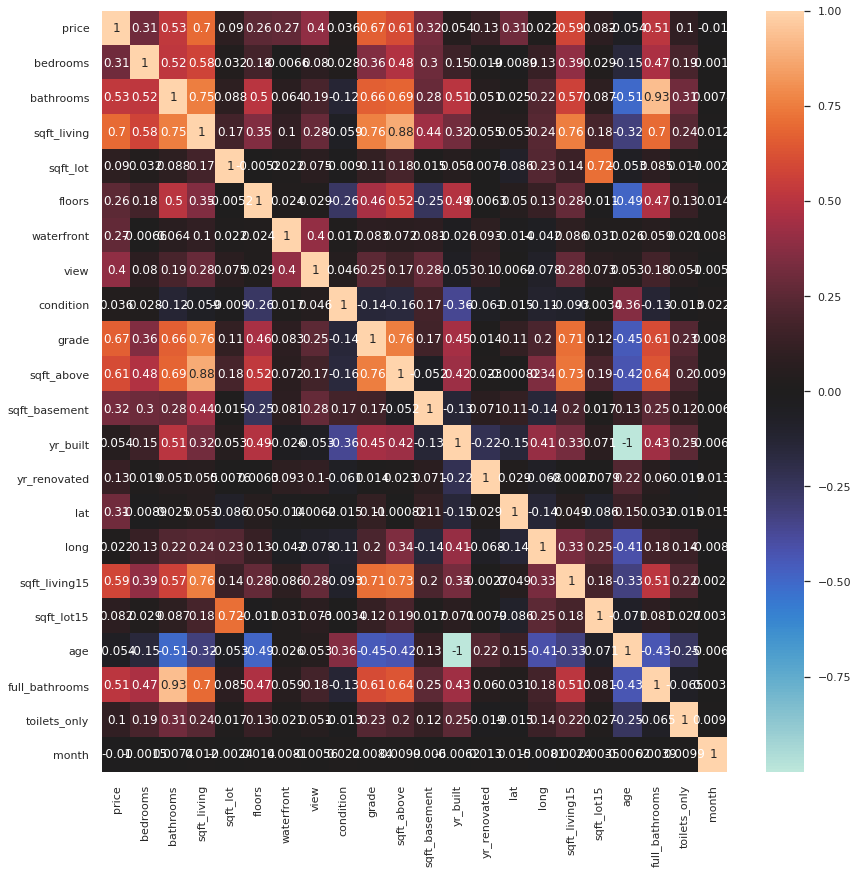

In [38]:
fig, ax = plt.subplots(figsize=(14, 14))
sns.heatmap(house_corr, ax = ax, annot = True, center = 0)
fig.show()

#### What is the extent of multicolinearity in the data?

In [37]:
house_eda_drop = house_eda.drop(['id', 'date', 'zipcode'], axis=1)
vif = pd.DataFrame({"VIF" : [variance_inflation_factor(house_eda_drop.values, i) for i in range(len(house_eda_drop.columns))]}, index=house_eda_drop.columns)
vif.sort_values("VIF",ascending=False)

/home/tiencheng/anaconda3/envs/data_sci_base_v1_2021/lib/python3.9/site-packages/statsmodels/stats/outliers_influence.py:193: RuntimeWarning: divide by zero encountered in double_scalars
  vif = 1. / (1. - r_squared_i)


,VIF
sqft_basement,inf
bathrooms,inf
sqft_living,inf
toilets_only,inf
full_bathrooms,inf
sqft_above,inf
yr_built,1.189190e+06
long,1.111531e+06
lat,1.488044e+05
age,8.980421e+02


#### Geographical Analysis

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


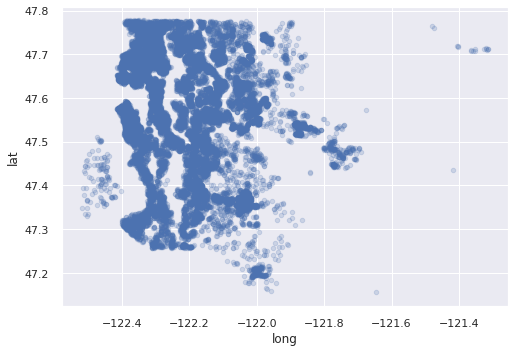

In [29]:
geographical_features = ["lat", "long"]
house_eda.plot(kind='scatter', x='long', y='lat', alpha=.2)
plt.show()

We see that most properties are in the more urbanised parts of King County (corresponding to Seattle, Renton, Kent)

Vashon Island is more rural in nature based on research, and hence has lower density of properties.

##### Is there a rural-urban divide? (Which parts of the city have more value)

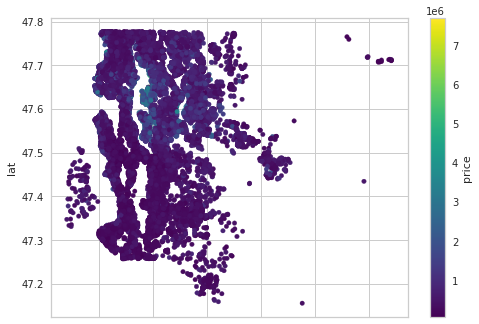

In [28]:
house_eda.plot(kind='scatter', x='long', y='lat', c='price', cmap='viridis')
plt.show()

We see that properties in the North appear to have higher values. Notably, they seem to be clustered in more urban areas.

##### Do waterfront properties hold more value?

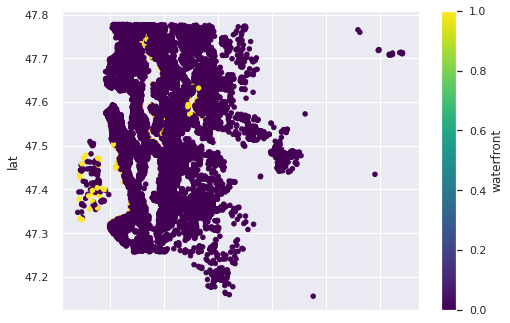

In [28]:
house_eda.plot(kind='scatter', x='long', y='lat', c='waterfront', cmap='viridis')
plt.show()

We note that properties near the lakes seem to hold more value. This could however be simply because these lakes are nearer to the city.

#### Time Series Analysis

In [43]:
house_eda["month"] = pd.to_datetime(house_eda["date"]).dt.month

<AxesSubplot:xlabel='month', ylabel='price'>

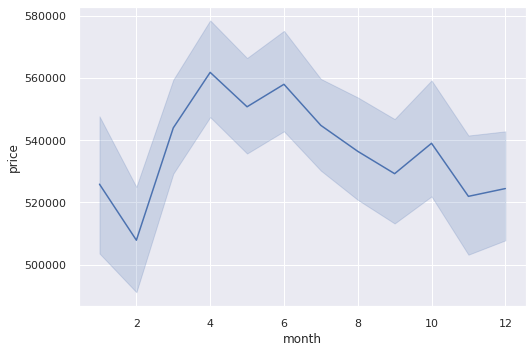

In [46]:
sns.lineplot(x="month", y="price", data = house_eda)

We see that price does appear to increase in earlier months, these months also correspond to months with higher demand for housing (as we saw earlier, most houses were sold in earlier months)

## Data Preparation

### Separate Target & Features

In [73]:
X, y = house_df.drop("price", axis = 1), house_df["price"]
X["month"] = pd.to_datetime(X["date"]).dt.month

### Dropping Uninformative Columns
- We will drop zipcode, id since based on our eda, these columns have relatively little utility, and having the zipcode would greatly increase the dimensionality of our data due to the need to one hot encode the data.

In [74]:
X.drop(["zipcode", "id", "date"], axis=1, inplace=True)

### Create Hold-Out Set

In [75]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=.2, shuffle=True,random_state = random_state)
X_train_dt, X_test_dt = X_train.copy(), X_test.copy()
X_train.drop("month", axis = 1, inplace=True)
X_test.drop("month", axis = 1, inplace=True)

/home/tiencheng/anaconda3/envs/data_sci_base_v1_2021/lib/python3.9/site-packages/pandas/core/frame.py:4308: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().drop(


### Data Pre-processing Pipeline
For our inital pre-processing steps, we will attempt:


#### Scaling
- Since many of the numerical features are on different scales, we will perform feature scaling to standarize their values


In [76]:
data_preprocessing = Pipeline([
    ('Feature Scaling (Standardization)', StandardScaler())
])

## Modelling
### Evaluation Methodology
To evaluate our model, we will make use of 

In [77]:
def evaluate_candidate_model(reg, X, y, metrics = ["neg_median_absolute_error", "neg_mean_absolute_percentage_error","neg_root_mean_squared_error"], cv = KFold(n_splits = 5, shuffle = True, random_state = 42), model_name = None, history = pd.DataFrame(), return_estimator = False, return_learning_curve = True):
    model_name = model_name if model_name is not None else type(reg).__name__
    single_metric = type(metrics) in { str, callable }
    scores = cross_validate(reg, X, y, cv = cv, scoring = metrics, return_train_score = True, return_estimator = return_estimator, n_jobs= -1)
    if return_estimator:
        best_estimator = scores["estimator"][np.argmax(scores["test_neg_mean_absolute_error"])]
        del scores["estimator"]
    scores = pd.DataFrame(scores).describe().iloc[1:3, 2:].round(5) # Get Summarized Cross Val Scores
    his_snapshot = scores.iloc[0, :]
    his_snapshot.rename(index=model_name, inplace=True)
    history = history.append(his_snapshot)
    if return_learning_curve:
        lr = learning_curve(reg, X, y, scoring = metrics[0], cv = cv, n_jobs=-1)
    return scores, history, lr if return_learning_curve else None, best_estimator if return_estimator else None

### Baseline Model (Mean Value Predictor)

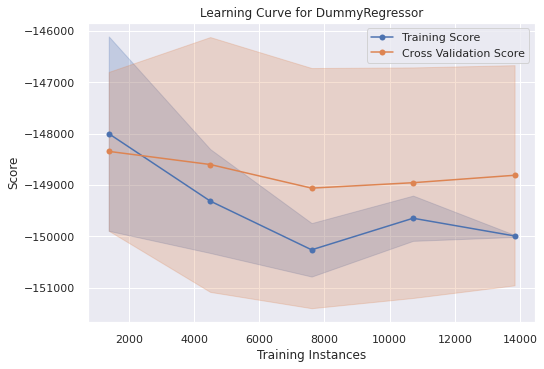

,test_neg_median_absolute_error,train_neg_median_absolute_error,test_neg_mean_absolute_percentage_error,train_neg_mean_absolute_percentage_error,test_neg_root_mean_squared_error,train_neg_root_mean_squared_error
mean,-148810.00000,-149990.00000,-0.42509,-0.42509,-371198.29271,-371908.69855
std,2393.84628,22.36068,0.00680,0.00171,26586.23194,6847.54433


In [78]:
baseline = Pipeline([
    ('Data Preprocessing', data_preprocessing),
    ('Model', DummyRegressor(strategy='median'))
])

scores, history, lr, _ = evaluate_candidate_model(baseline, X_train, y_train, model_name="Baseline")
display(scores)

We see that a baseline model that predicts the median performs extremely poorly. It has a median absolute error of 150.6K USD, meaning it is typically off by a significant margin. This is much higher than the max margin of error we are allowing the model to have of 15%.

### Linear Regression

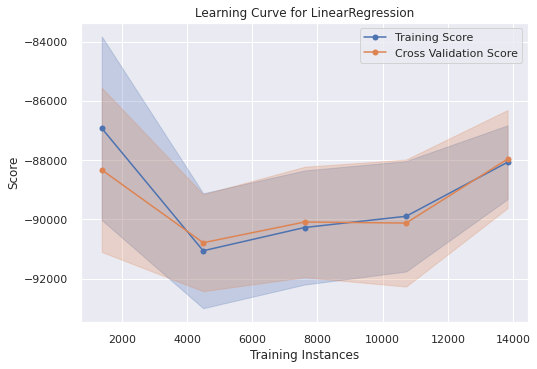

,test_neg_median_absolute_error,train_neg_median_absolute_error,test_neg_mean_absolute_percentage_error,train_neg_mean_absolute_percentage_error,test_neg_root_mean_squared_error,train_neg_root_mean_squared_error
mean,-87962.68054,-88069.09767,-0.25473,-0.2545,-200117.53033,-199451.57408
std,1850.76485,1393.32231,0.00403,0.0028,14832.07026,3750.62309


In [79]:
linreg = Pipeline([
    ('Data Preprocessing', data_preprocessing),
    ('Model', LinearRegression())
])

scores, history, lr, _ = evaluate_candidate_model(linreg, X_train, y_train, model_name="Linear Regression", history=history)
display(scores)

A basic linear regression model performs much better than the baseline, having approximately half of the median absolute error of the baseline. (88.6K USD). We also see that the variance of the model appears to be small, as the difference between the training and cross validation scores is low. This suggests that the linear regression model does not require regularization.

### Polynomial Regression

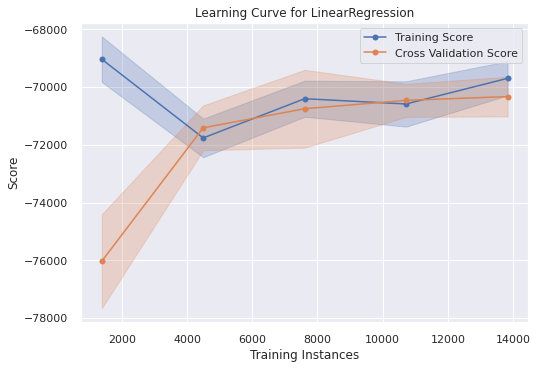

,test_neg_median_absolute_error,train_neg_median_absolute_error,test_neg_mean_absolute_percentage_error,train_neg_mean_absolute_percentage_error,test_neg_root_mean_squared_error,train_neg_root_mean_squared_error
mean,-70331.68881,-69699.84542,-0.21112,-0.20764,-160561.52770,-153260.79295
std,766.17048,662.75395,0.00233,0.00111,3393.45559,953.24751


In [80]:
poly_reg = Pipeline([
    ('Polynomial Features', PolynomialFeatures(degree=2)),
    ('Data Preprocessing', data_preprocessing),
    ('Model', LinearRegression())
])

scores, history, lr, _ = evaluate_candidate_model(poly_reg, X_train, y_train, model_name="Polynomial Regression", history=history)
display(scores)

We note that performing polynomial regression helps to reduce the bias of the model as the training median absolute error has decreased by approx 19K, however the model does slightly overfit more with more features.

### Decision Trees

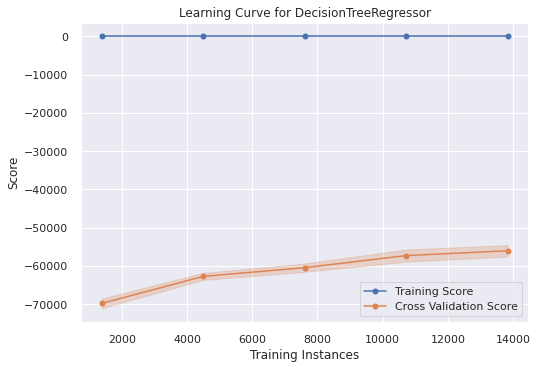

,test_neg_median_absolute_error,train_neg_median_absolute_error,test_neg_mean_absolute_percentage_error,train_neg_mean_absolute_percentage_error,test_neg_root_mean_squared_error,train_neg_root_mean_squared_error
mean,-56019.90000,0.0,-0.18863,-0.00237,-183341.63551,-8807.08186
std,1658.60221,0.0,0.00121,0.00017,12504.26503,617.62552


In [81]:
dt = Pipeline([
    ('Data Preprocessing', data_preprocessing),
    ('Model', DecisionTreeRegressor(random_state = random_state))
])

scores, history, lr, _ = evaluate_candidate_model(dt, X_train, y_train, model_name="Decision Tree Regressor", history=history)
display(scores)

A decision tree has very low bias, but very high variance as can be seen by the large gap in the median absolute error on training and cross validation.

### Random Forests

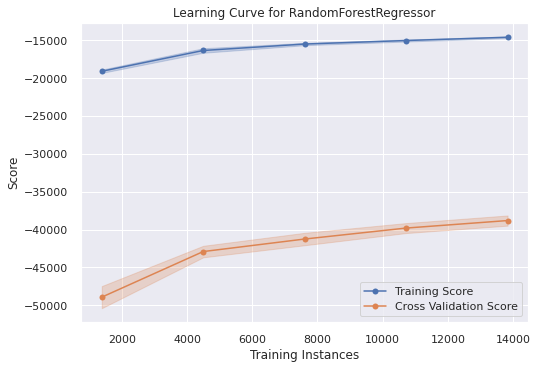

,test_neg_median_absolute_error,train_neg_median_absolute_error,test_neg_mean_absolute_percentage_error,train_neg_mean_absolute_percentage_error,test_neg_root_mean_squared_error,train_neg_root_mean_squared_error
mean,-38803.80567,-14589.47567,-0.13257,-0.05024,-129085.00633,-48711.22245
std,751.65810,125.16685,0.00271,0.00023,12772.14181,773.88823


In [48]:
rf = Pipeline([
    ('Data Preprocessing', data_preprocessing),
    ('Model', RandomForestRegressor(random_state = random_state))
])

scores, history, lr, _ = evaluate_candidate_model(rf, X_train, y_train, model_name="Random Forest Regressor", history=history)
display(scores)

A Random Forests based model is able to greatly reduce the overall variance while retaining the low bias of an individual decision tree. This is the first model that has an average margin of error of less than 15%.

### Extra Trees

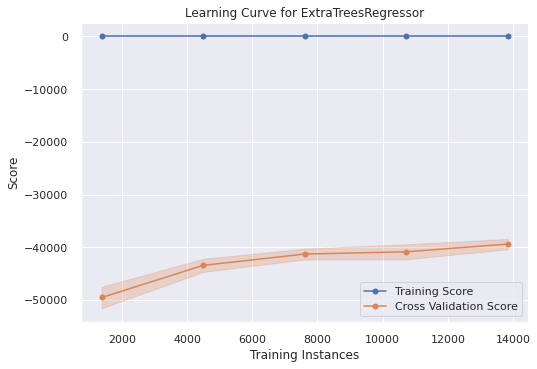

,test_neg_median_absolute_error,train_neg_median_absolute_error,test_neg_mean_absolute_percentage_error,train_neg_mean_absolute_percentage_error,test_neg_root_mean_squared_error,train_neg_root_mean_squared_error
mean,-39393.77250,0.0,-0.13398,-0.00237,-126558.55726,-8807.13720
std,1092.76784,0.0,0.00253,0.00017,6147.31676,617.56371


In [49]:
et = Pipeline([
    ('Data Preprocessing', data_preprocessing),
    ('Model', ExtraTreesRegressor(random_state = random_state))
])

scores, history, lr, _ = evaluate_candidate_model(et, X_train, y_train, model_name="Extra Trees Regressor", history=history)
display(scores)

An extra randomized forest has similar performance to Random Forests.

### Gradient Boosted Trees

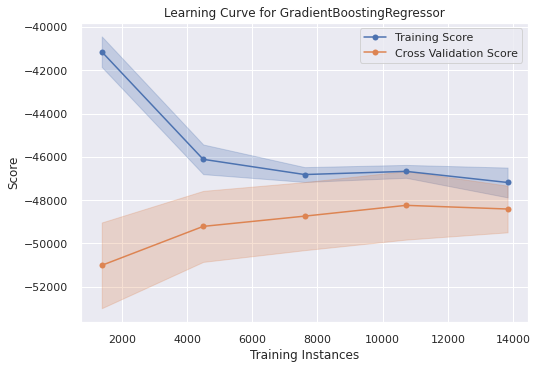

,test_neg_median_absolute_error,train_neg_median_absolute_error,test_neg_mean_absolute_percentage_error,train_neg_mean_absolute_percentage_error,test_neg_root_mean_squared_error,train_neg_root_mean_squared_error
mean,-48408.27225,-47183.23847,-0.15042,-0.14428,-131915.57563,-114269.00761
std,1203.86454,768.92650,0.00296,0.00144,2902.60691,1218.92884


In [50]:
gbm = Pipeline([
    ('Data Preprocessing', data_preprocessing),
    ('Model', GradientBoostingRegressor(random_state = random_state))
])

scores, history, lr, _ = evaluate_candidate_model(gbm, X_train, y_train, model_name="Gradient Boosting Regressor", history=history)
display(scores)

A gradient boosted model has higher bias than Random Forests, but has lower variance as shown by the learning curve.

### Histogram Gradient Boosting

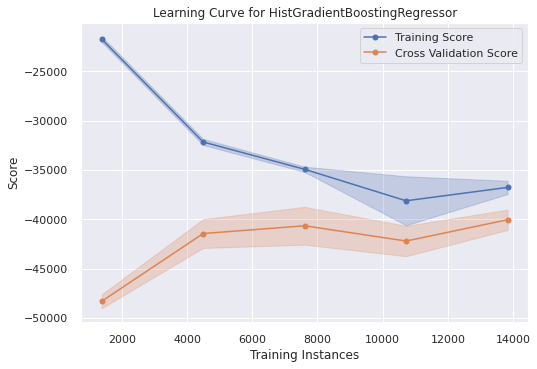

,test_neg_median_absolute_error,train_neg_median_absolute_error,test_neg_mean_absolute_percentage_error,train_neg_mean_absolute_percentage_error,test_neg_root_mean_squared_error,train_neg_root_mean_squared_error
mean,-40043.05211,-36762.48569,-0.12915,-0.11474,-124884.60485,-89151.22067
std,1149.79180,753.13382,0.00250,0.00143,14300.55577,2255.26082


In [51]:
lightgbm = Pipeline([
    ('Data Preprocessing', data_preprocessing),
    ('Model', HistGradientBoostingRegressor(random_state = random_state))
])

scores, history, lr, _ = evaluate_candidate_model(lightgbm, X_train, y_train, model_name="Histogram Gradient Boosting Regressor", history=history)
display(scores)

Compared to a normal gradient boosted tree, a histogram based gradient booster performs much better.

### Support Vector Classifier (Linear Kernel)
Since training time is too long with other kernels, a linear kernel has to be used.

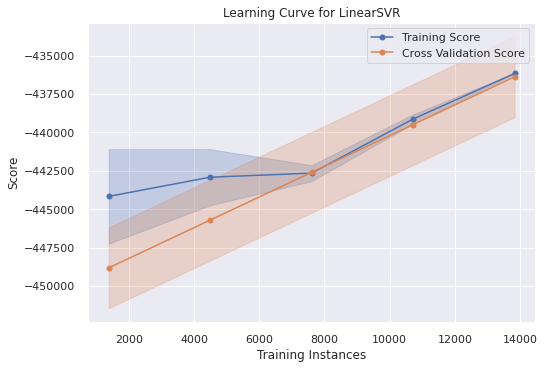

,test_neg_median_absolute_error,train_neg_median_absolute_error,test_neg_mean_absolute_percentage_error,train_neg_mean_absolute_percentage_error,test_neg_root_mean_squared_error,train_neg_root_mean_squared_error
mean,-436373.50000,-436158.00000,-0.96598,-0.96598,-636272.91648,-636504.0784
std,2942.13379,22.36068,0.00006,0.00002,19823.33974,5019.2462


In [52]:
svr = Pipeline([
    ('Data Preprocessing', data_preprocessing),
    ('Model', LinearSVR(random_state = random_state))
])

scores, history, lr, _ = evaluate_candidate_model(svr, X_train, y_train, model_name="SVR (Linear Kernel)", history=history)
display(scores)

A SVR with a Linear Kernel performs extremely badly, even worse than the stupid baseline.

### Summary of Various Models (Basic Preprocessing)

In [53]:
baseline_history = history.copy()
baseline_history.sort_values("test_neg_median_absolute_error", ascending=False)

,test_neg_mean_absolute_percentage_error,test_neg_median_absolute_error,test_neg_root_mean_squared_error,train_neg_mean_absolute_percentage_error,train_neg_median_absolute_error,train_neg_root_mean_squared_error
Random Forest Regressor,-0.13257,-38803.80567,-129085.00633,-0.05024,-14589.47567,-48711.22245
Extra Trees Regressor,-0.13398,-39393.77250,-126558.55726,-0.00237,0.00000,-8807.13720
Histogram Gradient Boosting Regressor,-0.12915,-40043.05211,-124884.60485,-0.11474,-36762.48569,-89151.22067
Gradient Boosting Regressor,-0.15042,-48408.27225,-131915.57563,-0.14428,-47183.23847,-114269.00761
Decision Tree Regressor,-0.18863,-56019.90000,-183341.63551,-0.00237,0.00000,-8807.08186
Polynomial Regression,-0.21112,-70331.68881,-160561.52770,-0.20764,-69699.84542,-153260.79295
Linear Regression,-0.25473,-87962.68054,-200117.53033,-0.25450,-88069.09767,-199451.57408
Baseline,-0.42509,-148810.00000,-371198.29271,-0.42509,-149990.00000,-371908.69855
SVR (Linear Kernel),-0.96598,-436373.50000,-636272.91648,-0.96598,-436158.00000,-636504.07840


We observe that
- with basic pre-processing, tree based models perform the best. 
- in terms of Median Absolute Error, random forests does the best.

## Model Improvement 

### Adding Polynomial Terms

In [54]:
models = [RandomForestRegressor(random_state=random_state), ExtraTreesRegressor(random_state=random_state), HistGradientBoostingRegressor(random_state=random_state)]
for model in tqdm(models):
    reg = Pipeline([
        ('Polynomial Features', PolynomialFeatures()),
        ('Feature Scaling', data_preprocessing),
        ('Model', model)
    ])
    model_name = type(model).__name__
    scores, history, lr, _ = evaluate_candidate_model(reg, X_train, y_train, model_name=f"{model_name} (Polynomial Terms)", history=history, return_learning_curve = False)
display(history)

100%|██████████| 3/3 [05:04<00:00, 101.58s/it]


,test_neg_mean_absolute_percentage_error,test_neg_median_absolute_error,test_neg_root_mean_squared_error,train_neg_mean_absolute_percentage_error,train_neg_median_absolute_error,train_neg_root_mean_squared_error
Baseline,-0.42509,-148810.00000,-371198.29271,-0.42509,-149990.00000,-371908.69855
Linear Regression,-0.25473,-87962.68054,-200117.53033,-0.25450,-88069.09767,-199451.57408
Polynomial Regression,-0.21112,-70331.68881,-160561.52770,-0.20764,-69699.84542,-153260.79295
Decision Tree Regressor,-0.18863,-56019.90000,-183341.63551,-0.00237,0.00000,-8807.08186
Random Forest Regressor,-0.13257,-38803.80567,-129085.00633,-0.05024,-14589.47567,-48711.22245
Extra Trees Regressor,-0.13398,-39393.77250,-126558.55726,-0.00237,0.00000,-8807.13720
Gradient Boosting Regressor,-0.15042,-48408.27225,-131915.57563,-0.14428,-47183.23847,-114269.00761
Histogram Gradient Boosting Regressor,-0.12915,-40043.05211,-124884.60485,-0.11474,-36762.48569,-89151.22067
SVR (Linear Kernel),-0.96598,-436373.50000,-636272.91648,-0.96598,-436158.00000,-636504.07840
RandomForestRegressor (Polynomial Terms),-0.13517,-39963.23500,-132141.75747,-0.05114,-14721.73467,-49931.24587


While adding polynomial terms improves a linear regression model, it does not seem to help for tree based models.

### Attempting Other Methods of Feature Scaling
Given the presence of outliers on many of our features, would our models benefit from different types of feature scaling?

In [55]:
models = [RandomForestRegressor(), ExtraTreesRegressor(), HistGradientBoostingRegressor()]
scalers = [RobustScaler(), MinMaxScaler(), QuantileTransformer(random_state=random_state)]
for model in tqdm(models):
    model_name = type(model).__name__
    for scaler in scalers:
        scaler_name = type(scaler).__name__
        reg = Pipeline([
            ('Feature Scaling', scaler),
            ('Model', model)
        ])
        scores, history, lr, _ = evaluate_candidate_model(reg, X_train, y_train, model_name=f"{model_name} ({scaler_name})", history=history, return_learning_curve = False)
display(history)

100%|██████████| 3/3 [01:25<00:00, 28.53s/it]


,test_neg_mean_absolute_percentage_error,test_neg_median_absolute_error,test_neg_root_mean_squared_error,train_neg_mean_absolute_percentage_error,train_neg_median_absolute_error,train_neg_root_mean_squared_error
Baseline,-0.42509,-148810.00000,-371198.29271,-0.42509,-149990.00000,-371908.69855
Linear Regression,-0.25473,-87962.68054,-200117.53033,-0.25450,-88069.09767,-199451.57408
Polynomial Regression,-0.21112,-70331.68881,-160561.52770,-0.20764,-69699.84542,-153260.79295
Decision Tree Regressor,-0.18863,-56019.90000,-183341.63551,-0.00237,0.00000,-8807.08186
Random Forest Regressor,-0.13257,-38803.80567,-129085.00633,-0.05024,-14589.47567,-48711.22245
Extra Trees Regressor,-0.13398,-39393.77250,-126558.55726,-0.00237,0.00000,-8807.13720
Gradient Boosting Regressor,-0.15042,-48408.27225,-131915.57563,-0.14428,-47183.23847,-114269.00761
Histogram Gradient Boosting Regressor,-0.12915,-40043.05211,-124884.60485,-0.11474,-36762.48569,-89151.22067
SVR (Linear Kernel),-0.96598,-436373.50000,-636272.91648,-0.96598,-436158.00000,-636504.07840
RandomForestRegressor (Polynomial Terms),-0.13517,-39963.23500,-132141.75747,-0.05114,-14721.73467,-49931.24587


In [56]:
history.sort_values("test_neg_median_absolute_error", ascending=False)

,test_neg_mean_absolute_percentage_error,test_neg_median_absolute_error,test_neg_root_mean_squared_error,train_neg_mean_absolute_percentage_error,train_neg_median_absolute_error,train_neg_root_mean_squared_error
RandomForestRegressor (MinMaxScaler),-0.13230,-38761.89233,-129799.81991,-0.05021,-14492.36300,-49169.56134
Random Forest Regressor,-0.13257,-38803.80567,-129085.00633,-0.05024,-14589.47567,-48711.22245
RandomForestRegressor (QuantileTransformer),-0.13283,-38812.80867,-129142.43537,-0.05034,-14513.43800,-48764.73963
ExtraTreesRegressor (Polynomial Terms),-0.13274,-39071.63900,-126544.77047,-0.00237,0.00000,-8807.08497
RandomForestRegressor (RobustScaler),-0.13247,-39144.77000,-128595.58976,-0.05034,-14591.36800,-49233.83954
ExtraTreesRegressor (MinMaxScaler),-0.13377,-39148.05850,-125545.90386,-0.00237,0.00000,-8807.11966
ExtraTreesRegressor (RobustScaler),-0.13367,-39285.20100,-126687.12834,-0.00237,0.00000,-8807.12751
Extra Trees Regressor,-0.13398,-39393.77250,-126558.55726,-0.00237,0.00000,-8807.13720
HistGradientBoostingRegressor (RobustScaler),-0.12909,-39766.12962,-123903.19428,-0.11477,-36696.46342,-89339.48996
ExtraTreesRegressor (QuantileTransformer),-0.13454,-39775.36500,-132815.86810,-0.00237,0.00000,-8807.11591


We note that the Robust (IQR and Median Based Standarization) and MinMax Scaler (Normalization) perform the best on the data

### Transforming the Target Variable
From our EDA, we found that price follows a log-normal distribution. We attempt to apply a log transformation on our target to see if it improves the performance of our models.

In [57]:
models = [RandomForestRegressor(random_state=random_state), ExtraTreesRegressor(random_state=random_state), HistGradientBoostingRegressor(random_state=random_state)]
for model in tqdm(models):
    reg = Pipeline([
        ('Feature Scaling', data_preprocessing),
        ('Model', model)
    ])
    transformed_reg = TransformedTargetRegressor(reg, func=np.log, inverse_func=np.exp)
    model_name = type(model).__name__
    scores, history, lr, _ = evaluate_candidate_model(transformed_reg, X_train, y_train, model_name=f"{model_name} (Log Transform on Price)", history=history, return_learning_curve = False)
display(history)

100%|██████████| 3/3 [00:29<00:00,  9.99s/it]


,test_neg_mean_absolute_percentage_error,test_neg_median_absolute_error,test_neg_root_mean_squared_error,train_neg_mean_absolute_percentage_error,train_neg_median_absolute_error,train_neg_root_mean_squared_error
Baseline,-0.42509,-148810.00000,-371198.29271,-0.42509,-149990.00000,-371908.69855
Linear Regression,-0.25473,-87962.68054,-200117.53033,-0.25450,-88069.09767,-199451.57408
Polynomial Regression,-0.21112,-70331.68881,-160561.52770,-0.20764,-69699.84542,-153260.79295
Decision Tree Regressor,-0.18863,-56019.90000,-183341.63551,-0.00237,0.00000,-8807.08186
Random Forest Regressor,-0.13257,-38803.80567,-129085.00633,-0.05024,-14589.47567,-48711.22245
Extra Trees Regressor,-0.13398,-39393.77250,-126558.55726,-0.00237,0.00000,-8807.13720
Gradient Boosting Regressor,-0.15042,-48408.27225,-131915.57563,-0.14428,-47183.23847,-114269.00761
Histogram Gradient Boosting Regressor,-0.12915,-40043.05211,-124884.60485,-0.11474,-36762.48569,-89151.22067
SVR (Linear Kernel),-0.96598,-436373.50000,-636272.91648,-0.96598,-436158.00000,-636504.07840
RandomForestRegressor (Polynomial Terms),-0.13517,-39963.23500,-132141.75747,-0.05114,-14721.73467,-49931.24587


In [58]:
history.nlargest(5, "test_neg_median_absolute_error")

,test_neg_mean_absolute_percentage_error,test_neg_median_absolute_error,test_neg_root_mean_squared_error,train_neg_mean_absolute_percentage_error,train_neg_median_absolute_error,train_neg_root_mean_squared_error
HistGradientBoostingRegressor (Log Transform on Price),-0.12195,-38377.06661,-121641.74211,-0.10524,-34248.28861,-95563.51158
RandomForestRegressor (MinMaxScaler),-0.13230,-38761.89233,-129799.81991,-0.05021,-14492.36300,-49169.56134
RandomForestRegressor (Log Transform on Price),-0.12928,-38795.07572,-133875.87652,-0.04811,-14328.31815,-54941.97495
Random Forest Regressor,-0.13257,-38803.80567,-129085.00633,-0.05024,-14589.47567,-48711.22245
RandomForestRegressor (QuantileTransformer),-0.13283,-38812.80867,-129142.43537,-0.05034,-14513.43800,-48764.73963


We see that it does indeed appear to improve the model performance. The top models are now those with transformed target values.

### Using Time Features
In our baseline preprocessing, we dropped all date features entirely. Is it possible that these date features can benefit our model?

In [84]:
data_preprocessing_dt = Pipeline([
    ('Encode Categorical Variables', ColumnTransformer([
        ('OHE Month', OneHotEncoder(), ["month"])
    ], remainder="passthrough")),
    ("Feature Scaling", StandardScaler())
])
models = [RandomForestRegressor(random_state=random_state), ExtraTreesRegressor(random_state=random_state), HistGradientBoostingRegressor(random_state=random_state)]
for model in tqdm(models):
    reg = Pipeline([
        ('Data Preprocessing', data_preprocessing_dt),
        ('Model', model)
    ])
    model_name = type(model).__name__
    scores, history, lr, _ = evaluate_candidate_model(reg, X_train_dt, y_train, model_name=f"{model_name} (Month as Feature)", history=history, return_learning_curve = False)
display(history)

100%|██████████| 3/3 [00:33<00:00, 11.14s/it]


,test_neg_mean_absolute_percentage_error,test_neg_median_absolute_error,test_neg_root_mean_squared_error,train_neg_mean_absolute_percentage_error,train_neg_median_absolute_error,train_neg_root_mean_squared_error
Baseline,-0.42509,-148810.00000,-371198.29271,-0.42509,-149990.00000,-371908.69855
Linear Regression,-0.25473,-87962.68054,-200117.53033,-0.25450,-88069.09767,-199451.57408
Polynomial Regression,-0.21112,-70331.68881,-160561.52770,-0.20764,-69699.84542,-153260.79295
Decision Tree Regressor,-0.18863,-56019.90000,-183341.63551,-0.00237,0.00000,-8807.08186
RandomForestRegressor (Month as Feature),-0.13200,-38596.67900,-129762.22246,-0.04903,-14416.28000,-48053.11478
ExtraTreesRegressor (Month as Feature),-0.13354,-39535.56700,-126379.56426,-0.00000,0.00000,-3.33865
HistGradientBoostingRegressor (Month as Feature),-0.12796,-39274.13044,-124547.09463,-0.11331,-36126.51169,-88561.49455


It seems that month, when one hot encoded, can improve the performance of our models.

In [85]:
baseline_history

,test_neg_mean_absolute_percentage_error,test_neg_median_absolute_error,test_neg_root_mean_squared_error,train_neg_mean_absolute_percentage_error,train_neg_median_absolute_error,train_neg_root_mean_squared_error
Baseline,-0.42509,-148810.00000,-371198.29271,-0.42509,-149990.00000,-371908.69855
Linear Regression,-0.25473,-87962.68054,-200117.53033,-0.25450,-88069.09767,-199451.57408
Polynomial Regression,-0.21112,-70331.68881,-160561.52770,-0.20764,-69699.84542,-153260.79295
Decision Tree Regressor,-0.18863,-56019.90000,-183341.63551,-0.00237,0.00000,-8807.08186
Random Forest Regressor,-0.13257,-38803.80567,-129085.00633,-0.05024,-14589.47567,-48711.22245
Extra Trees Regressor,-0.13398,-39393.77250,-126558.55726,-0.00237,0.00000,-8807.13720
Gradient Boosting Regressor,-0.15042,-48408.27225,-131915.57563,-0.14428,-47183.23847,-114269.00761
Histogram Gradient Boosting Regressor,-0.12915,-40043.05211,-124884.60485,-0.11474,-36762.48569,-89151.22067
SVR (Linear Kernel),-0.96598,-436373.50000,-636272.91648,-0.96598,-436158.00000,-636504.07840


### Adding Indicator Values
We noted during our EDA that some columns had values that were actually missing, prefilled with other values. These missing values were missing not at random, as they denoted the absence of a feature. Could having an indicator column for the absence of these values help improve our model?

In [86]:
data_preprocessing_na = Pipeline([
    ('Mark as NA', ColumnTransformer([
        ('Mark NA', MissingIndicator(missing_values = 0), ["sqft_basement", "yr_renovated"])
    ], remainder="passthrough")),
    ("Feature Scaling", StandardScaler())
])
data_preprocessing_na.fit_transform(X_train)

array([[ 0.79899729,  0.20830039, -0.39526335, ...,  0.44228847,
         1.12607326,  0.01344043],
       [-1.25156871,  0.20830039, -1.46896378, ..., -0.53995821,
        -1.04652268, -0.28066159],
       [-1.25156871,  0.20830039, -0.39526335, ..., -0.86025604,
        -1.19331971, -0.1789339 ],
       ...,
       [ 0.79899729,  0.20830039, -0.39526335, ...,  1.29641601,
        -0.42997519, -0.36604019],
       [ 0.79899729,  0.20830039, -2.54266422, ..., -0.77484328,
        -1.19331971,  0.08265159],
       [ 0.79899729,  0.20830039,  0.67843709, ...,  0.81952813,
         1.52242522, -0.24443927]])

In [87]:

models = [RandomForestRegressor(random_state=random_state), ExtraTreesRegressor(random_state=random_state), HistGradientBoostingRegressor(random_state=random_state)]
for model in tqdm(models):
    reg = Pipeline([
        ('Data Preprocessing', data_preprocessing_na),
        ('Model', model)
    ])
    model_name = type(model).__name__
    scores, history, lr, _ = evaluate_candidate_model(reg, X_train, y_train, model_name=f"{model_name} (Missing Indicator)", history=history, return_learning_curve = False)
display(history)

100%|██████████| 3/3 [00:27<00:00,  9.07s/it]


,test_neg_mean_absolute_percentage_error,test_neg_median_absolute_error,test_neg_root_mean_squared_error,train_neg_mean_absolute_percentage_error,train_neg_median_absolute_error,train_neg_root_mean_squared_error
Baseline,-0.42509,-148810.00000,-371198.29271,-0.42509,-149990.00000,-371908.69855
Linear Regression,-0.25473,-87962.68054,-200117.53033,-0.25450,-88069.09767,-199451.57408
Polynomial Regression,-0.21112,-70331.68881,-160561.52770,-0.20764,-69699.84542,-153260.79295
Decision Tree Regressor,-0.18863,-56019.90000,-183341.63551,-0.00237,0.00000,-8807.08186
RandomForestRegressor (Month as Feature),-0.13200,-38596.67900,-129762.22246,-0.04903,-14416.28000,-48053.11478
ExtraTreesRegressor (Month as Feature),-0.13354,-39535.56700,-126379.56426,-0.00000,0.00000,-3.33865
HistGradientBoostingRegressor (Month as Feature),-0.12796,-39274.13044,-124547.09463,-0.11331,-36126.51169,-88561.49455
RandomForestRegressor (Missing Indicator),-0.13266,-38857.62900,-129820.56656,-0.05024,-14564.65400,-48702.41346
ExtraTreesRegressor (Missing Indicator),-0.13431,-39534.51100,-126137.23911,-0.00237,0.00000,-8807.11463
HistGradientBoostingRegressor (Missing Indicator),-0.12944,-40084.47199,-124943.09343,-0.11571,-37192.80901,-91421.79802


Adding missing indicators does appear to have some impact on the model.

### Feature Selection
We attempt to perform feature selection to 

Since impurity based importances are biased towards high cardinality data (continuous), we will not utilize such measures to select our features.

Comparison

In [96]:
data_preprocessing_fs = Pipeline([
    ('Feature Engineering', ColumnTransformer([
        ('Mark NA', MissingIndicator(missing_values = 0), ["sqft_basement", "yr_renovated"]),
        ('OHE Month', OneHotEncoder(), ["month"])
    ], remainder="passthrough")),
    ('Feature Scaling', StandardScaler()),
])
data_preprocessing_fs

Pipeline(steps=[('Feature Engineering',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('Mark NA',
                                                  MissingIndicator(missing_values=0),
                                                  ['sqft_basement',
                                                   'yr_renovated']),
                                                 ('OHE Month', OneHotEncoder(),
                                                  ['month'])])),
                ('Feature Scaling', StandardScaler())])

In [97]:
models = [RandomForestRegressor(random_state=random_state), ExtraTreesRegressor(random_state=random_state), HistGradientBoostingRegressor(random_state=random_state)]
for model in tqdm(models):
    reg = Pipeline([
        ('Data Preprocessing', data_preprocessing_fs),
        ('Model', model)
    ])
    model_name = type(model).__name__
    scores, history, lr, _ = evaluate_candidate_model(reg, X_train_dt, y_train, model_name=f"{model_name} (FS Baseline)", history=history, return_learning_curve = False)
display(history)

100%|██████████| 3/3 [00:32<00:00, 10.71s/it]


,test_neg_mean_absolute_percentage_error,test_neg_median_absolute_error,test_neg_root_mean_squared_error,train_neg_mean_absolute_percentage_error,train_neg_median_absolute_error,train_neg_root_mean_squared_error
Baseline,-0.42509,-148810.00000,-371198.29271,-0.42509,-149990.00000,-371908.69855
Linear Regression,-0.25473,-87962.68054,-200117.53033,-0.25450,-88069.09767,-199451.57408
Polynomial Regression,-0.21112,-70331.68881,-160561.52770,-0.20764,-69699.84542,-153260.79295
Decision Tree Regressor,-0.18863,-56019.90000,-183341.63551,-0.00237,0.00000,-8807.08186
RandomForestRegressor (Month as Feature),-0.13200,-38596.67900,-129762.22246,-0.04903,-14416.28000,-48053.11478
ExtraTreesRegressor (Month as Feature),-0.13354,-39535.56700,-126379.56426,-0.00000,0.00000,-3.33865
HistGradientBoostingRegressor (Month as Feature),-0.12796,-39274.13044,-124547.09463,-0.11331,-36126.51169,-88561.49455
RandomForestRegressor (Missing Indicator),-0.13266,-38857.62900,-129820.56656,-0.05024,-14564.65400,-48702.41346
ExtraTreesRegressor (Missing Indicator),-0.13431,-39534.51100,-126137.23911,-0.00237,0.00000,-8807.11463
HistGradientBoostingRegressor (Missing Indicator),-0.12944,-40084.47199,-124943.09343,-0.11571,-37192.80901,-91421.79802


#### Select From Model

In [107]:
data_preprocessing_fs = Pipeline([
    ('Feature Engineering', ColumnTransformer([
        ('Mark NA', MissingIndicator(missing_values = 0), ["sqft_basement", "yr_renovated"]),
        ('OHE Month', OneHotEncoder(), ["month"])
    ], remainder="passthrough")),
    ('Feature Scaling', StandardScaler()),
    ('Feature Selection',  RFE(RandomForestRegressor(), n_features_to_select=.85))
])
data_preprocessing_fs

Pipeline(steps=[('Feature Engineering',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('Mark NA',
                                                  MissingIndicator(missing_values=0),
                                                  ['sqft_basement',
                                                   'yr_renovated']),
                                                 ('OHE Month', OneHotEncoder(),
                                                  ['month'])])),
                ('Feature Scaling', StandardScaler()),
                ('Feature Selection',
                 RFE(estimator=RandomForestRegressor(),
                     n_features_to_select=0.85))])

In [108]:
models = [RandomForestRegressor(random_state=random_state), ExtraTreesRegressor(random_state=random_state), HistGradientBoostingRegressor(random_state=random_state)]
for model in tqdm(models):
    reg = Pipeline([
        ('Data Preprocessing', data_preprocessing_fs),
        ('Model', model)
    ])
    model_name = type(model).__name__
    scores, history, lr, _ = evaluate_candidate_model(reg, X_train_dt, y_train, model_name=f"{model_name} (Recursive Feature Elimination)", history=history, return_learning_curve = False)
display(history)

100%|██████████| 3/3 [07:37<00:00, 152.33s/it]


,test_neg_mean_absolute_percentage_error,test_neg_median_absolute_error,test_neg_root_mean_squared_error,train_neg_mean_absolute_percentage_error,train_neg_median_absolute_error,train_neg_root_mean_squared_error
Baseline,-0.42509,-148810.00000,-371198.29271,-0.42509,-149990.00000,-371908.69855
Linear Regression,-0.25473,-87962.68054,-200117.53033,-0.25450,-88069.09767,-199451.57408
Polynomial Regression,-0.21112,-70331.68881,-160561.52770,-0.20764,-69699.84542,-153260.79295
Decision Tree Regressor,-0.18863,-56019.90000,-183341.63551,-0.00237,0.00000,-8807.08186
RandomForestRegressor (Month as Feature),-0.13200,-38596.67900,-129762.22246,-0.04903,-14416.28000,-48053.11478
ExtraTreesRegressor (Month as Feature),-0.13354,-39535.56700,-126379.56426,-0.00000,0.00000,-3.33865
HistGradientBoostingRegressor (Month as Feature),-0.12796,-39274.13044,-124547.09463,-0.11331,-36126.51169,-88561.49455
RandomForestRegressor (Missing Indicator),-0.13266,-38857.62900,-129820.56656,-0.05024,-14564.65400,-48702.41346
ExtraTreesRegressor (Missing Indicator),-0.13431,-39534.51100,-126137.23911,-0.00237,0.00000,-8807.11463
HistGradientBoostingRegressor (Missing Indicator),-0.12944,-40084.47199,-124943.09343,-0.11571,-37192.80901,-91421.79802


### Hyperparameter Tuning

## Final Model

## Model Evaluation

### Residual Plot

### Feature Importances

## Conclusion